# Advanced Lane Finding Project
The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera Calibration
### Finding Corners

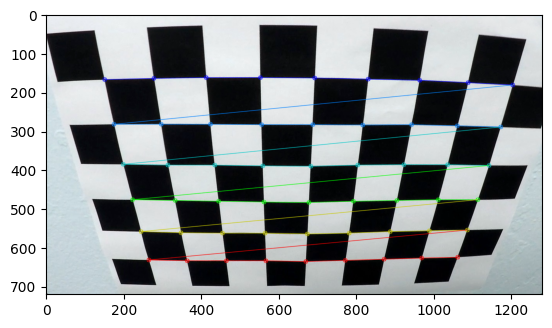

In [436]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# prepare object points
nx = 9  # the number of inside corners in x
ny = 6  # the number of inside corners in y

# Make a list of calibration images
fname = 'camera_cal/calibration2.jpg'
img = cv2.imread(fname)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

### Calibrating the Camera

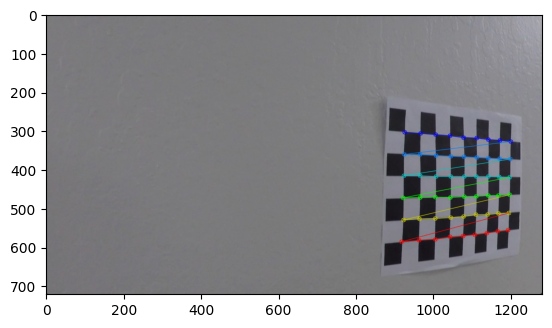

In [438]:
import glob

# Read in and make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Arrays to store object points and image points from all the images
objpoints = []  # 3D points in real world space
imgpoints = []  # 2D points in image plane

# prepare object points
nx = 9  # the number of inside corners in x
ny = 6  # the number of inside corners in y

# Prepare object points, like (0, 0, 0), (1, 0, 0), (2, 0, 0) ...., (7, 5, 0)
objp = np.zeros((ny * nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)  # x, y coordinates

for fname in images:
    # read in each image
    img = mpimg.imread(fname)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If corners are found, add object points, image points
    if ret:
        imgpoints.append(corners)
        objpoints.append(objp)

        # draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)

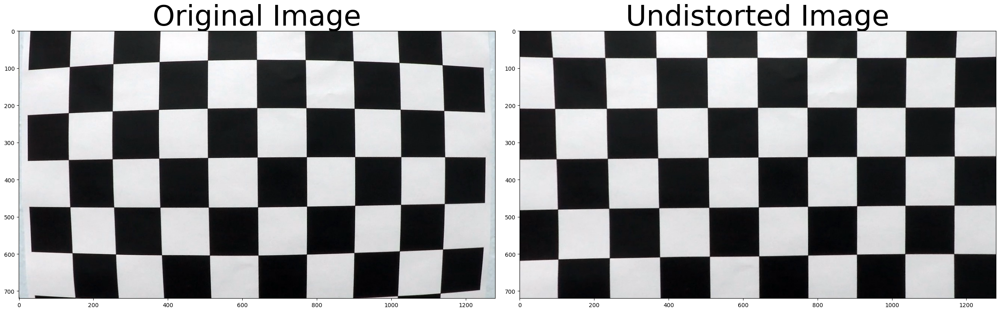

In [439]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in an image
img = cv2.imread('camera_cal/calibration1.jpg')

# Takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    return undist

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Gradients and Color Spaces

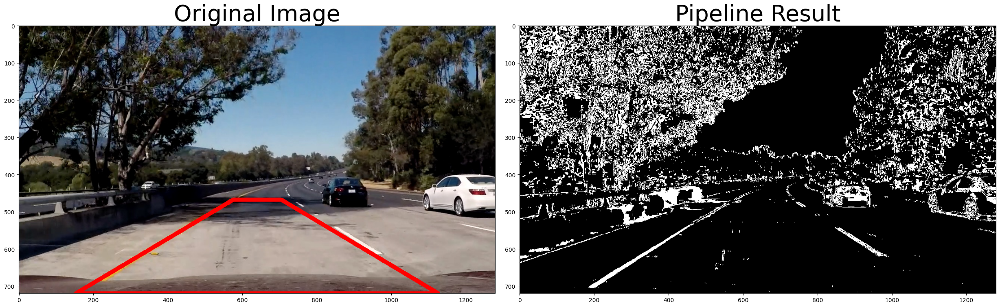

In [440]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test5.jpg')

undistorted = cal_undistort(image, objpoints, imgpoints)

# Edit this function to create your own pipeline.
def binarize(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    binary = (sxbinary | s_binary) * 255
    return binary

result = binarize(undistorted)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

src = np.int32([[image.shape[1] // 2 + image.shape[1] * 0.05, image.shape[0] * 0.65],
            [image.shape[1] - image.shape[1] * 0.12, image.shape[0]],
            [image.shape[1] * 0.12, image.shape[0]],
            [image.shape[1] // 2 - image.shape[1] * 0.05, image.shape[0] * 0.65]])

image = cv2.polylines(image, [src],
                      True, (255, 0, 0), 10)
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective Transform

In [441]:
def trapezoid_unwarp(img):
    # Pass in your image into this function
    # Write code to do the following steps
    img = np.copy(img)
    
    # a) draw corners
    img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

    # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
        #Note: you could pick any four of the detected corners 
        # as long as those four corners define a rectangle
        #One especially smart way to do this would be to use four well-chosen
        # corners that were automatically detected during the undistortion steps
        #We recommend using the automatic detection of corners in your code
    src = np.float32([[img.shape[1] // 2 + img.shape[1] * 0.05, img.shape[0] * 0.65],
            [img.shape[1] - img.shape[1] * 0.12, img.shape[0]],
            [img.shape[1] * 0.12, img.shape[0]],
            [img.shape[1] // 2 - img.shape[1] * 0.05, img.shape[0] * 0.65]])

    # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    margin = img.shape[1] * 0.25
    dst = np.float32([[img.shape[1] - margin, margin],
                      [img.shape[1] - margin, img.shape[0]],
                      [margin, img.shape[0]],
                      [margin, margin]])
    
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

    return warped, M, Minv

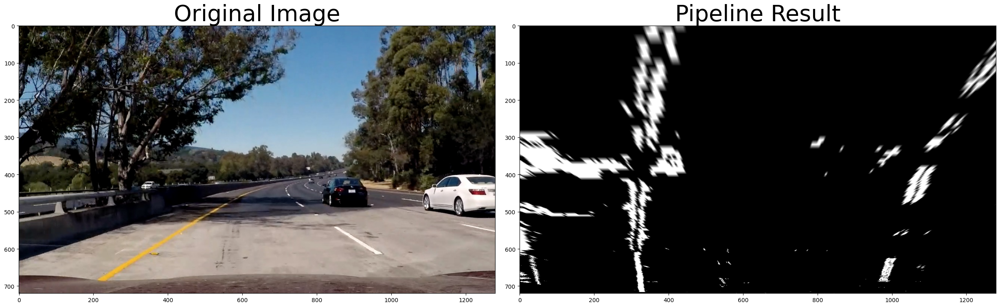

In [442]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test5.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)

    img = cal_undistort(img, objpoints, imgpoints)
    img = binarize(undistorted)
   
    img, M, _ = trapezoid_unwarp(img)
    return img
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 4. Finding the Lines: Sliding Window

In [443]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2


def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(histogram.shape[0] // 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = int(binary_warped.shape[0] // nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2) 
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                            (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                            (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit

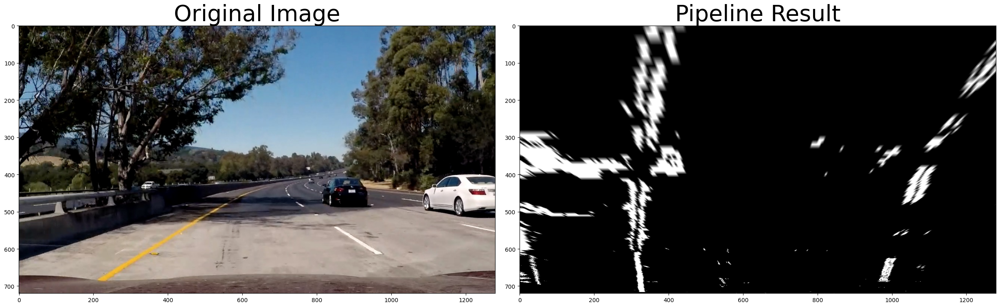

In [444]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test5.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    img = cal_undistort(img, objpoints, imgpoints)
    img = binarize(undistorted, s_thresh=(170, 255), sx_thresh=(20, 100))
    img, M, _ = trapezoid_unwarp(img)
    _, _ = fit_polynomial(img)

    return img
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 5. Finding the Lines: Search from Prior

In [445]:
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt


def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit

def search_around_poly(binary_warped, left_fit=None, right_fit=None):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = np.abs(nonzerox - left_fit[0] * nonzeroy**2 - left_fit[1] * nonzeroy - left_fit[2]) < margin
    right_lane_inds = np.abs(nonzerox - right_fit[0] * nonzeroy**2 - right_fit[1] * nonzeroy - right_fit[2]) < margin
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    return left_fit, right_fit

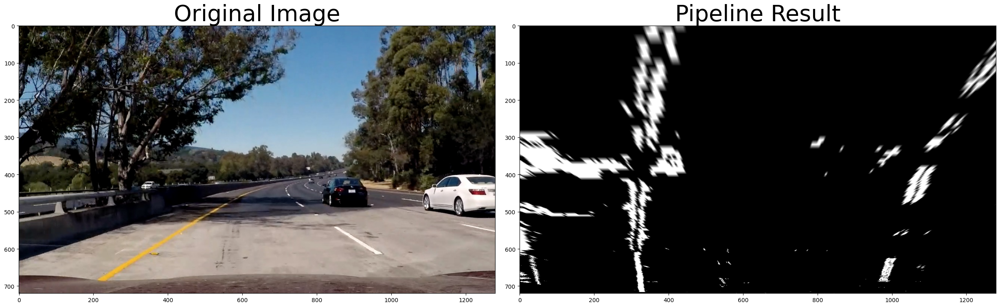

In [446]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('test_images/test5.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100), left_fit=None, right_fit=None):
    img = np.copy(img)
    
    img = cal_undistort(img, objpoints, imgpoints)
    img = binarize(undistorted, s_thresh=s_thresh, sx_thresh=sx_thresh)
    img, M, _ = trapezoid_unwarp(img)
    if left_fit and right_fit:
        left_fit, right_fit = search_around_poly(img, left_fit, right_fit)

    if left_fit is None or right_fit is None:
        left_fit, right_fit = fit_polynomial(img)
     
    return img
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Warp the detected lane boundaries back onto the original image.

In [447]:
def draw_lines(img, points, color=[255, 0, 0], thickness=2):
    for i in range(len(points) - 1):
        cv2.line(img, (int(points[i][0]), int(points[i][1])), (int(points[i+1][0]), int(points[i+1][1])), color, thickness)
    
    return img

In [456]:
def write_curvature(img, left_fit, right_fit, ploty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720 # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700 # meters per pixel in x dimension
    font = cv2.FONT_HERSHEY_SIMPLEX

    ploty = left_pts[:, 1]
    y_eval_cr = np.max(ploty) * ym_per_pix

    left_curverad = (1 + (2 * left_fit_cr[0] * y_eval_cr + left_fit_cr[1])**2)**(3/2) / np.abs(2 * left_fit_cr[0])  
    right_curverad = (1 + (2 * right_fit_cr[0] * y_eval_cr + right_fit_cr[1])**2)**(3/2) / np.abs(2 * right_fit_cr[0])
    curverad = (left_curverad + right_curverad) / 2
    cv2.putText(img, f'Left lane curvature: {curverad:.2f}m', (50, 50), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    
    return img

def write_offset(img, left_pts, right_pts, xm_per_pix):
    font = cv2.FONT_HERSHEY_SIMPLEX
    lane_center = (right_pts[-1][0] + left_pts[-1][0]) / 2
    vehicle_center = img.shape[1] / 2
    offset = (vehicle_center - lane_center) * xm_per_pix

    if offset < 0:
        cv2.putText(img, f'Vehicle is {abs(offset):.2f}m left of center', (50, 100), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    else:
        cv2.putText(img, f'Vehicle is {offset:.2f}m right of center', (50, 100), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    
    return img

In [457]:
def draw_lane(img, Minv, left_fit, right_fit):
    # Pass in your image into this function
    # Write code to do the following steps
    img = np.copy(img)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    left_pts = np.array([left_fitx, ploty]).T
    left_pts = cv2.perspectiveTransform(left_pts[None, :, :], Minv).squeeze()
    img = draw_lines(img, left_pts)

    right_pts = np.array([right_fitx, ploty]).T
    right_pts = cv2.perspectiveTransform(right_pts[None, :, :], Minv).squeeze()
    img = draw_lines(img, right_pts)

    img = write_offset(img, left_pts, right_pts, xm_per_pix=3.7/700)

    vertices = np.vstack((left_pts, right_pts[::-1])).astype(np.int32)
    overlay = img.copy()
    overlay = cv2.fillConvexPoly(overlay, vertices, (0, 255, 0))
    alpha = 0.25
    img = cv2.addWeighted(img, (1 - alpha), overlay, alpha, 0)

    return img

(720, 1280, 3)


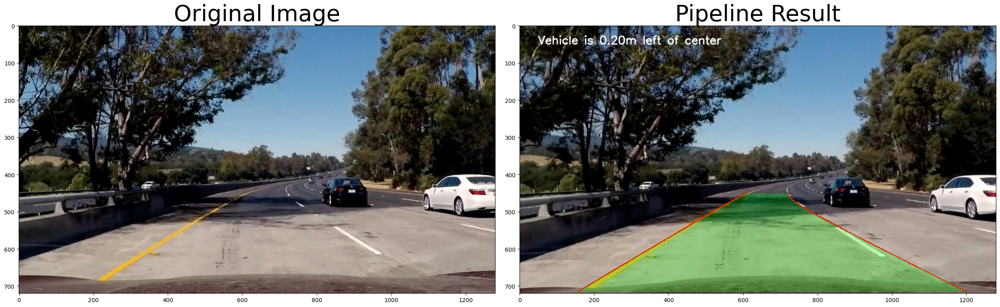

In [458]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image = mpimg.imread('test_images/test5.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100), left_fit=None, right_fit=None):
    img = np.copy(img)
    
    img = cal_undistort(img, objpoints, imgpoints)
    img_orig = np.copy(img)
    img = binarize(undistorted, s_thresh=s_thresh, sx_thresh=sx_thresh)
    img, M, Minv = trapezoid_unwarp(img)
    if left_fit and right_fit:
        left_fit, right_fit = search_around_poly(img, left_fit, right_fit)

    if left_fit is None or right_fit is None:
        left_fit, right_fit = fit_polynomial(img)
     
    img = draw_lane(img_orig, Minv, left_fit, right_fit)
    return img
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)